In [ ]:
import os
os.chdir("./sample_data")

In [12]:
!ls

data_final.yaml		      traffic_density_analysis.mp4
data.yaml		      train
nal1			      valid
processed_sample_video.mp4    Vehicle_Detection_dataset_augmented
README.dataset.txt	      Vehicle_Detection_YOLOv8.v1i.yolov8.zip
README_Final		      Vehicle_Detection_YOLOv8.v2i.yolov8.zip
README.roboflow.txt	      Vehicle_Detection_YOLOv8.v4i.yolov8.zip
runs			      yolo11n.pt
sample_image.jpg	      YOLOv8
sample_video.mp4	      yolov8n.pt
traffic_density_analysis.avi


In [ ]:
!unzip Vehicle_Detection_YOLOv8.v4i.yolov8.zip -d Vehicle_Detection_dataset_augmented

In [5]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 66.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 110.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 79.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 60.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 63.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

In [6]:
import warnings
warnings.filterwarnings('ignore')

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import yaml
from PIL import Image
from ultralytics import YOLO
from IPython.display import Video

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [7]:
sns.set(rc={'axes.facecolor':'#eae8fa'}, style='darkgrid')

In [8]:
model = YOLO('yolov8n.pt')

100%|██████████| 6.25M/6.25M [00:00<00:00, 209MB/s]


In [9]:
%pwd

'/content/gdrive/MyDrive/Vehicle_Detection_Image_Dataset'


image 1/1 /content/gdrive/.shortcut-targets-by-id/1yNzPyIi-U5t-p1n3phwuaNsjQjI4ruA2/Vehicle_Detection_Image_Dataset/sample_image.jpg: 384x640 5 cars, 53.6ms
Speed: 13.8ms preprocess, 53.6ms inference, 330.1ms postprocess per image at shape (1, 3, 384, 640)


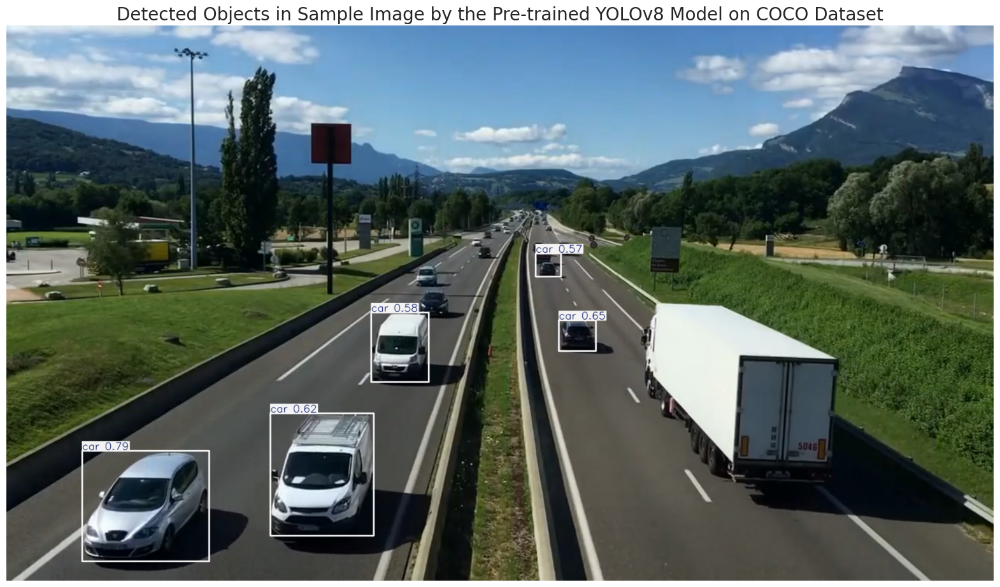

In [13]:
img_path = 'sample_image.jpg'
results = model.predict(source=img_path, imgsz=640, conf=0.5)
sample_img = results[0].plot(line_width=2)
sample_img = cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20, 15))
plt.imshow(sample_img)
plt.title('Detected Objects in Sample Image by the Pre-trained YOLOv8 Model on COCO Dataset', fontsize=20)
plt.axis('off')
plt.show()

In [14]:
dataset_path = '/content/gdrive/MyDrive/Vehicle_Detection_Image_Dataset/Vehicle_Detection_dataset_augmented'
yaml_filepath = os.path.join(dataset_path, 'data.yaml')
with open(yaml_filepath, 'r') as file:
    yaml_data = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_data, default_flow_style=False))

names:
- Vehicle
nc: 1
roboflow:
  license: CC BY 4.0
  project: vehicle_detection_yolov8-dmmfx
  url: https://universe.roboflow.com/cs506-traffic-density/vehicle_detection_yolov8-dmmfx/dataset/4
  version: 4
  workspace: cs506-traffic-density
test: ../test/images
train: ../train/images
val: ../valid/images



In [15]:
train_img_path = os.path.join(dataset_path, 'train', 'images')
valid_img_path = os.path.join(dataset_path, 'valid', 'images')

num_train = 0
num_valid = 0

train_size = set()
valid_size = set()

for f in os.listdir(train_img_path):
    if f.endswith('.jpg'):
        num_train = num_train + 1
        image_path = os.path.join(train_img_path, f)
        with Image.open(image_path) as img:
            train_size.add(img.size)

for f in os.listdir(valid_img_path):
    if f.endswith('.jpg'):
        num_valid += 1
        image_path = os.path.join(valid_img_path, f)
        with Image.open(image_path) as img:
            valid_size.add(img.size)

# Print the results
print(f"Number of training images: {num_train}")
print(f"Number of validation images: {num_valid}")

# Check if all images in training set have the same size
if len(train_size) == 1:
    print(f"All training images have the same size: {train_size.pop()}")
else:
    print("Training images have varying sizes.")

# Check if all images in validation set have the same size
if len(valid_size) == 1:
    print(f"All validation images have the same size: {valid_size.pop()}")
else:
    print("Validation images have varying sizes.")

Number of training images: 960
Number of validation images: 205
All training images have the same size: (640, 640)
All validation images have the same size: (640, 640)


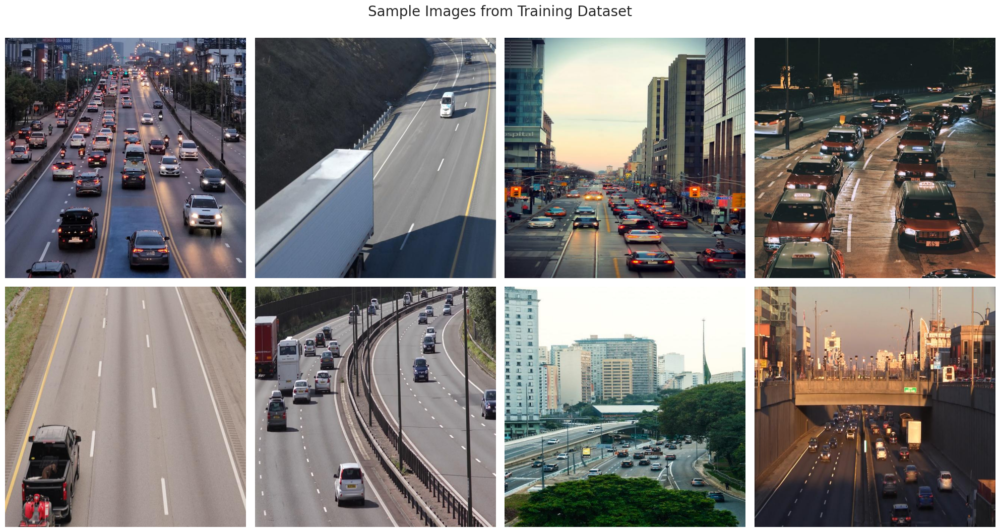

In [16]:
# List all jpg images in the directory
image_files = [file for file in os.listdir(train_img_path) if file.endswith('.jpg')]

# Select 8 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 8)]

# Create a 2x4 subplot
fig, axes = plt.subplots(2, 4, figsize=(20, 11))

# Display each of the selected images
for ax, img_file in zip(axes.ravel(), selected_images):
    img_path = os.path.join(train_img_path, img_file)
    image = Image.open(img_path)
    ax.imshow(image)
    ax.axis('off')

plt.suptitle('Sample Images from Training Dataset', fontsize=20)
plt.tight_layout()
plt.show()

In [17]:
train_params = {
    'data': 'data.yaml',
    #'epochs': 150,  # Increased epochs for better learning
    'imgsz': 640,  # Standard input size
    'patience': 20,  # Early stopping with reduced patience
    'batch': 16,  # Adjusted for better stability
    'optimizer': 'AdamW',  # Alternative optimizer for better convergence
    'lr0': 1e-4,  # Increased learning rate for better initial updates
    'lrf': 0.05,  # More aggressive learning rate decay
    'dropout': 0.1,  # Regularization
    'seed': 7,  # Ensure reproducibility
    'hsv_h': 0.015,  # Data augmentation (color variations)
    'hsv_s': 0.7,
    'hsv_v': 0.4,
    'degrees': 5.0,  # Rotation augmentation
    'translate': 0.1,  # Translation augmentation
    'scale': 0.5,  # Scaling augmentation
    'shear': 2.0,  # Shear augmentation
    'mosaic': 1.0,      # combine 4 images into one
    'mixup': 0.5,       # blend two images/labels
    'copy_paste': 0.5,  # paste object masks from one image into another
    }

# Train the model
for name, param in model.named_parameters():
    if "model.head" in name:      # YOLOv8’s detection head lives under model.head
        param.requires_grad = True
    else:
        param.requires_grad = False
model.train(epochs = 20, **train_params)
for param in model.parameters():
    param.requires_grad = True
fine_tune_params = train_params.copy()
fine_tune_params.update({
    'epochs': 130,
    'lr0': 1e-4,    # smaller initial LR
    'lrf': 0.1      # gentler decay
})

# results = model.train(
#     data = yaml_filepath,
#     epochs = 100,
#     imgsz = 640,
#     device = 0,
#     patience = 50,
#     batch = 32,
#     optimizer = 'auto',
#     lr0 = 0.0001,
#     lrf = 0.1,
#     dropout = 0.1,
#     seed = 0
#     )

Ultralytics 8.3.122 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=data.yaml, epochs=20, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train10, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=7, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.1, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=to

100%|██████████| 755k/755k [00:00<00:00, 102MB/s]

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

Model summary: 129 layers, 3,011,043 parameters, 3,011,027 gradients, 8.2 GFLOPs

Transferred 58/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...
AMP: checks passed ✅
train: Fast image access ✅ (ping: 1.1±0.9 ms, read: 0.0±0.0 MB/s, size: 61.2 KB)


train: Scanning /content/gdrive/.shortcut-targets-by-id/1yNzPyIi-U5t-p1n3phwuaNsjQjI4ruA2/Vehicle_Detection_Image_Dataset/train/labels.cache... 1496 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1496/1496 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.8±0.3 ms, read: 0.0±0.0 MB/s, size: 52.5 KB)


val: Scanning /content/gdrive/.shortcut-targets-by-id/1yNzPyIi-U5t-p1n3phwuaNsjQjI4ruA2/Vehicle_Detection_Image_Dataset/valid/labels.cache... 295 images, 0 backgrounds, 0 corrupt: 100%|██████████| 295/295 [00:00<?, ?it/s]


Plotting labels to runs/detect/train10/labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train10
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      4.24G       1.82      1.708      1.367        411        640: 100%|██████████| 94/94 [01:08<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [01:34<00:00,  9.45s/it]

                   all        295       4358      0.822       0.57      0.701      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      4.27G      1.549      1.177       1.19        215        640: 100%|██████████| 94/94 [00:40<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.47it/s]


                   all        295       4358      0.803      0.736      0.816      0.501

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      4.62G      1.505      1.081      1.158        371        640: 100%|██████████| 94/94 [00:40<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.68it/s]

                   all        295       4358      0.805      0.784      0.853       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      4.63G      1.463      1.014      1.135         98        640: 100%|██████████| 94/94 [00:39<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.84it/s]

                   all        295       4358      0.828      0.783      0.867      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      4.65G      1.429     0.9805      1.121        268        640: 100%|██████████| 94/94 [00:39<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.75it/s]

                   all        295       4358      0.829      0.787      0.872      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      4.67G      1.432     0.9669      1.123        307        640: 100%|██████████| 94/94 [00:39<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.44it/s]

                   all        295       4358      0.831      0.803      0.879      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      5.03G      1.402     0.9278      1.105        192        640: 100%|██████████| 94/94 [00:37<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.01it/s]

                   all        295       4358      0.831      0.801      0.881       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      5.03G       1.41      0.932      1.103        237        640: 100%|██████████| 94/94 [00:37<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.01it/s]


                   all        295       4358       0.83      0.804       0.88      0.564

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      5.04G      1.393     0.9107      1.098        142        640: 100%|██████████| 94/94 [00:39<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.36it/s]

                   all        295       4358      0.839      0.805      0.884      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      5.04G      1.392     0.9129      1.099        222        640: 100%|██████████| 94/94 [00:39<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.62it/s]


                   all        295       4358      0.838      0.808      0.887      0.573
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      5.05G      1.243     0.8729      1.036        120        640: 100%|██████████| 94/94 [00:29<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.81it/s]


                   all        295       4358      0.838       0.81      0.889      0.575

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      5.06G      1.232      0.793      1.033        172        640: 100%|██████████| 94/94 [00:27<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.48it/s]


                   all        295       4358      0.841      0.802      0.884      0.579

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      5.06G      1.218     0.7667      1.024         91        640: 100%|██████████| 94/94 [00:28<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  3.10it/s]


                   all        295       4358      0.831      0.807      0.889      0.576

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      5.07G       1.21     0.7574      1.023         63        640: 100%|██████████| 94/94 [00:27<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.80it/s]

                   all        295       4358      0.853      0.807      0.892      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      5.08G      1.214     0.7534      1.027        204        640: 100%|██████████| 94/94 [00:28<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.51it/s]


                   all        295       4358      0.835      0.813      0.892      0.577

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      5.08G        1.2     0.7344      1.018        156        640: 100%|██████████| 94/94 [00:27<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.99it/s]

                   all        295       4358      0.851      0.805      0.894      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      5.08G      1.195     0.7323      1.018        111        640: 100%|██████████| 94/94 [00:28<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  3.13it/s]


                   all        295       4358      0.845      0.813      0.895      0.585

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      5.08G        1.2     0.7299      1.021        147        640: 100%|██████████| 94/94 [00:27<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.28it/s]

                   all        295       4358      0.856      0.803      0.895       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      5.08G      1.195     0.7316      1.016        175        640: 100%|██████████| 94/94 [00:28<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.90it/s]

                   all        295       4358      0.855      0.805      0.894      0.585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      5.08G      1.199     0.7243       1.02        138        640: 100%|██████████| 94/94 [00:27<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.90it/s]

                   all        295       4358      0.848      0.813      0.895      0.587



20 epochs completed in 0.245 hours.
Optimizer stripped from runs/detect/train10/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train10/weights/best.pt, 6.2MB

Validating runs/detect/train10/weights/best.pt...
Ultralytics 8.3.122 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.43it/s]


                   all        295       4358      0.856      0.803      0.895       0.59
Speed: 0.4ms preprocess, 3.3ms inference, 0.0ms loss, 5.3ms postprocess per image
Results saved to runs/detect/train10


In [19]:
model = YOLO('runs/detect/train10/weights/best.pt')
results = model.train(**fine_tune_params)

Ultralytics 8.3.122 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train10/weights/best.pt, data=data.yaml, epochs=130, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train11, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=7, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.1, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, 

train: Scanning /content/gdrive/.shortcut-targets-by-id/1yNzPyIi-U5t-p1n3phwuaNsjQjI4ruA2/Vehicle_Detection_Image_Dataset/train/labels.cache... 1496 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1496/1496 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 1.6±2.5 ms, read: 12.6±5.4 MB/s, size: 52.5 KB)


val: Scanning /content/gdrive/.shortcut-targets-by-id/1yNzPyIi-U5t-p1n3phwuaNsjQjI4ruA2/Vehicle_Detection_Image_Dataset/valid/labels.cache... 295 images, 0 backgrounds, 0 corrupt: 100%|██████████| 295/295 [00:00<?, ?it/s]


Plotting labels to runs/detect/train11/labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train11
Starting training for 130 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/130      4.31G      1.402     0.9278      1.098        411        640: 100%|██████████| 94/94 [00:41<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.56it/s]


                   all        295       4358      0.752      0.741      0.807        0.5

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/130      4.33G      1.364     0.8786      1.085        215        640: 100%|██████████| 94/94 [00:38<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.80it/s]

                   all        295       4358      0.848      0.806      0.889      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/130      4.66G      1.358     0.8617      1.079        371        640: 100%|██████████| 94/94 [00:39<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.49it/s]

                   all        295       4358       0.84      0.823      0.894      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/130      4.66G      1.336     0.8382      1.068         98        640: 100%|██████████| 94/94 [00:37<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.47it/s]

                   all        295       4358      0.852      0.818      0.894      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/130      4.66G      1.319     0.8283      1.064        268        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.25it/s]


                   all        295       4358      0.849      0.819      0.897       0.59

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/130      4.66G      1.332     0.8256      1.071        307        640: 100%|██████████| 94/94 [00:38<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.13it/s]

                   all        295       4358      0.866      0.812        0.9      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/130      5.03G      1.308     0.7992      1.058        192        640: 100%|██████████| 94/94 [00:38<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.52it/s]

                   all        295       4358      0.856      0.816      0.897      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/130      5.03G      1.322     0.8151      1.058        237        640: 100%|██████████| 94/94 [00:38<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        295       4358      0.857       0.81      0.896      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/130      5.03G       1.31     0.7995      1.057        142        640: 100%|██████████| 94/94 [00:38<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.73it/s]


                   all        295       4358      0.841      0.835        0.9      0.593

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/130      5.03G       1.31     0.8037      1.059        222        640: 100%|██████████| 94/94 [00:38<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.75it/s]

                   all        295       4358      0.859      0.828      0.907      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/130      5.03G      1.297     0.7885      1.055        192        640: 100%|██████████| 94/94 [00:39<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.85it/s]

                   all        295       4358       0.86      0.823      0.901      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/130      5.03G      1.303     0.7937      1.059        201        640: 100%|██████████| 94/94 [00:38<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.68it/s]

                   all        295       4358      0.858      0.825      0.902      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/130       5.4G      1.295      0.781      1.054        160        640: 100%|██████████| 94/94 [00:38<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.89it/s]

                   all        295       4358       0.86      0.819      0.903      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/130       5.4G       1.29     0.7707      1.051        265        640: 100%|██████████| 94/94 [00:38<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.44it/s]

                   all        295       4358      0.863      0.827      0.906      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/130       5.4G      1.302     0.7877      1.052        305        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.15it/s]

                   all        295       4358      0.859      0.834       0.91      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/130      5.85G      1.291      0.769      1.049        223        640: 100%|██████████| 94/94 [00:37<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.01it/s]

                   all        295       4358      0.851      0.824      0.902      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/130      5.85G      1.286     0.7787      1.047        236        640: 100%|██████████| 94/94 [00:38<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.35it/s]

                   all        295       4358      0.858      0.834      0.909      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/130      6.33G      1.289     0.7713       1.05        209        640: 100%|██████████| 94/94 [00:40<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.87it/s]

                   all        295       4358      0.842      0.829      0.899      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/130      6.33G      1.282     0.7694      1.048        228        640: 100%|██████████| 94/94 [00:38<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        295       4358      0.863      0.835      0.911      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/130      6.33G      1.276     0.7615      1.045        137        640: 100%|██████████| 94/94 [00:39<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.70it/s]

                   all        295       4358      0.857      0.835       0.91      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/130      6.33G      1.275     0.7584      1.042        292        640: 100%|██████████| 94/94 [00:39<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.42it/s]

                   all        295       4358      0.862      0.837      0.913       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/130      6.33G      1.264     0.7563      1.044        258        640: 100%|██████████| 94/94 [00:36<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.07it/s]


                   all        295       4358      0.857      0.837      0.913      0.616

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/130      6.33G      1.275     0.7621      1.045        192        640: 100%|██████████| 94/94 [00:38<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.39it/s]

                   all        295       4358      0.852      0.839       0.91      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/130      6.33G      1.264     0.7467       1.04        313        640: 100%|██████████| 94/94 [00:38<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.60it/s]

                   all        295       4358      0.851      0.837       0.91       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/130      6.33G      1.256      0.744      1.038        359        640: 100%|██████████| 94/94 [00:39<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  3.02it/s]

                   all        295       4358      0.859      0.839      0.913      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/130      6.33G      1.262     0.7527      1.039        124        640: 100%|██████████| 94/94 [00:38<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.84it/s]

                   all        295       4358      0.869       0.84      0.917      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/130      6.33G      1.272     0.7454      1.043        169        640: 100%|██████████| 94/94 [00:38<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.74it/s]

                   all        295       4358      0.855      0.839      0.913      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/130      6.33G      1.263     0.7447      1.038        243        640: 100%|██████████| 94/94 [00:38<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.63it/s]

                   all        295       4358      0.854      0.844      0.913      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/130      6.34G      1.259     0.7468      1.039        191        640: 100%|██████████| 94/94 [00:38<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.48it/s]

                   all        295       4358       0.86      0.842      0.912      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/130      6.35G      1.264     0.7513      1.042        307        640: 100%|██████████| 94/94 [00:37<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.12it/s]

                   all        295       4358      0.851      0.847      0.911       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/130      6.35G      1.252     0.7375      1.034        220        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.17it/s]

                   all        295       4358      0.853      0.848      0.917      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/130      6.35G      1.247     0.7286      1.032        141        640: 100%|██████████| 94/94 [00:38<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.84it/s]

                   all        295       4358      0.855      0.842      0.916      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/130      6.35G      1.247     0.7395      1.033        173        640: 100%|██████████| 94/94 [00:38<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]

                   all        295       4358      0.848      0.847      0.914      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/130      6.35G      1.253     0.7318      1.036        174        640: 100%|██████████| 94/94 [00:38<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.99it/s]

                   all        295       4358      0.853      0.848      0.915      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/130      6.35G      1.252     0.7297      1.033        317        640: 100%|██████████| 94/94 [00:38<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.62it/s]

                   all        295       4358      0.858      0.841      0.911      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/130      6.35G      1.248     0.7227       1.03        232        640: 100%|██████████| 94/94 [00:38<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.15it/s]

                   all        295       4358      0.848      0.852      0.912      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/130      6.35G      1.226     0.7268      1.027        148        640: 100%|██████████| 94/94 [00:37<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.17it/s]

                   all        295       4358      0.855      0.843      0.913      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/130      6.35G      1.234     0.7254      1.028        273        640: 100%|██████████| 94/94 [00:37<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.06it/s]

                   all        295       4358      0.859      0.845      0.918      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/130      6.35G      1.244      0.723      1.033        341        640: 100%|██████████| 94/94 [00:39<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.92it/s]

                   all        295       4358      0.855      0.852      0.919      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/130      6.35G      1.227     0.7146      1.025        267        640: 100%|██████████| 94/94 [00:38<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.82it/s]

                   all        295       4358      0.851      0.848      0.917      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/130      6.35G      1.247     0.7296      1.031        123        640: 100%|██████████| 94/94 [00:38<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.74it/s]

                   all        295       4358      0.852      0.844      0.916      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/130      6.35G      1.236     0.7194      1.027        248        640: 100%|██████████| 94/94 [00:38<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.91it/s]

                   all        295       4358      0.853      0.853      0.921      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/130      6.35G      1.242     0.7223      1.028        377        640: 100%|██████████| 94/94 [00:38<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.86it/s]

                   all        295       4358      0.863      0.834      0.915      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/130      6.35G      1.225     0.7141      1.022        260        640: 100%|██████████| 94/94 [00:38<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.28it/s]

                   all        295       4358      0.856      0.846      0.918       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/130      6.35G      1.233      0.722      1.033        189        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.14it/s]

                   all        295       4358      0.859      0.841      0.917      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/130      6.35G      1.229     0.7162      1.026        254        640: 100%|██████████| 94/94 [00:38<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.91it/s]

                   all        295       4358      0.861      0.833      0.915      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/130      6.35G       1.24     0.7172      1.028        382        640: 100%|██████████| 94/94 [00:38<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.84it/s]

                   all        295       4358      0.858      0.846      0.919       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/130      6.35G       1.22     0.7085      1.025        206        640: 100%|██████████| 94/94 [00:38<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]

                   all        295       4358      0.849      0.853      0.918      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/130      6.35G       1.23     0.7063      1.026        134        640: 100%|██████████| 94/94 [00:38<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.96it/s]

                   all        295       4358      0.856      0.848      0.917      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/130      6.35G      1.227     0.7075      1.025        245        640: 100%|██████████| 94/94 [00:38<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.80it/s]


                   all        295       4358       0.85      0.855       0.92      0.626

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/130      6.35G      1.219     0.7001      1.022        204        640: 100%|██████████| 94/94 [00:38<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.42it/s]

                   all        295       4358      0.849      0.851      0.917      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/130      6.35G      1.233     0.7168      1.026        251        640: 100%|██████████| 94/94 [00:37<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.07it/s]

                   all        295       4358      0.855      0.847      0.916      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/130      6.35G      1.226     0.6995      1.024        269        640: 100%|██████████| 94/94 [00:38<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.28it/s]

                   all        295       4358      0.849      0.859      0.921      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/130      6.35G      1.228     0.7041      1.025        194        640: 100%|██████████| 94/94 [00:39<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.67it/s]

                   all        295       4358      0.845      0.855      0.918      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/130      6.35G      1.221     0.7057       1.02        257        640: 100%|██████████| 94/94 [00:38<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.95it/s]


                   all        295       4358      0.851      0.856       0.92      0.629

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/130      6.35G      1.216      0.697      1.019        245        640: 100%|██████████| 94/94 [00:38<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.93it/s]

                   all        295       4358      0.852      0.858      0.918      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/130      6.35G      1.226     0.7089      1.021        227        640: 100%|██████████| 94/94 [00:38<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.92it/s]

                   all        295       4358      0.851      0.853      0.918      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/130      6.35G      1.222     0.7038      1.027        218        640: 100%|██████████| 94/94 [00:38<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.64it/s]


                   all        295       4358      0.861      0.842      0.916      0.632

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/130      6.35G      1.221     0.6997      1.021        244        640: 100%|██████████| 94/94 [00:38<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.14it/s]

                   all        295       4358      0.848      0.855      0.919      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/130      6.35G      1.223     0.7027      1.023        138        640: 100%|██████████| 94/94 [00:38<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.37it/s]

                   all        295       4358      0.865      0.832      0.915      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/130      6.35G      1.212     0.6939      1.016        241        640: 100%|██████████| 94/94 [00:37<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.45it/s]

                   all        295       4358       0.86      0.838      0.918      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/130      6.35G      1.228     0.7015      1.023        252        640: 100%|██████████| 94/94 [00:38<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.95it/s]

                   all        295       4358      0.853      0.851       0.92      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/130      6.35G        1.2     0.6917      1.015         91        640: 100%|██████████| 94/94 [00:38<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.87it/s]

                   all        295       4358      0.863      0.834      0.915      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/130      6.35G      1.213     0.6973      1.021        269        640: 100%|██████████| 94/94 [00:38<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.49it/s]

                   all        295       4358      0.855      0.848       0.92      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/130      6.35G      1.213     0.6885      1.018        231        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.72it/s]

                   all        295       4358      0.858      0.849      0.919      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/130      6.35G      1.216     0.6958      1.022        323        640: 100%|██████████| 94/94 [00:38<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.21it/s]


                   all        295       4358      0.858      0.848      0.921      0.622

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/130      6.35G      1.216     0.6892      1.018        227        640: 100%|██████████| 94/94 [00:37<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.16it/s]

                   all        295       4358      0.854      0.853      0.921      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/130      6.35G      1.215     0.7027       1.02        170        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.34it/s]

                   all        295       4358      0.857      0.853      0.922      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/130      6.35G      1.212      0.686      1.019        303        640: 100%|██████████| 94/94 [00:38<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.92it/s]

                   all        295       4358      0.854      0.853      0.921      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/130      6.35G      1.212     0.6966       1.02        328        640: 100%|██████████| 94/94 [00:38<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.92it/s]

                   all        295       4358      0.853      0.856      0.922      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/130      6.35G      1.212     0.6945      1.019        217        640: 100%|██████████| 94/94 [00:39<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  3.02it/s]

                   all        295       4358      0.857      0.848       0.92      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/130      6.35G       1.21      0.693      1.016        284        640: 100%|██████████| 94/94 [00:38<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.86it/s]

                   all        295       4358       0.86      0.846       0.92      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/130      6.37G      1.219     0.6942      1.019        342        640: 100%|██████████| 94/94 [00:38<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.13it/s]

                   all        295       4358      0.858      0.851      0.922      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/130      6.37G        1.2     0.6825      1.015        289        640: 100%|██████████| 94/94 [00:38<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.05it/s]

                   all        295       4358       0.86      0.844      0.921      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/130      6.37G      1.197      0.681      1.013        174        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.75it/s]

                   all        295       4358       0.86      0.845      0.921      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/130      6.37G      1.191     0.6802       1.01        305        640: 100%|██████████| 94/94 [00:38<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.87it/s]


                   all        295       4358      0.862      0.844       0.92      0.635

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/130      6.37G      1.209     0.6918       1.02        367        640: 100%|██████████| 94/94 [00:38<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  3.02it/s]

                   all        295       4358      0.858      0.846      0.921       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/130      6.37G      1.207     0.6957      1.021        192        640: 100%|██████████| 94/94 [00:38<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.94it/s]

                   all        295       4358      0.858      0.854      0.922      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/130      6.37G      1.208     0.6866      1.016        268        640: 100%|██████████| 94/94 [00:39<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.97it/s]

                   all        295       4358       0.86      0.844      0.921      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/130      6.37G      1.203     0.6812      1.012        341        640: 100%|██████████| 94/94 [00:38<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.96it/s]

                   all        295       4358      0.859      0.854      0.921      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/130      6.37G      1.197     0.6828      1.014        204        640: 100%|██████████| 94/94 [00:38<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.22it/s]

                   all        295       4358      0.854      0.848      0.919       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/130      6.37G      1.196     0.6806      1.017        164        640: 100%|██████████| 94/94 [00:37<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.11it/s]

                   all        295       4358      0.863      0.846      0.919      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/130      6.37G      1.205     0.6889      1.015        141        640: 100%|██████████| 94/94 [00:36<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.08it/s]

                   all        295       4358      0.865      0.838      0.917      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/130      6.37G      1.203     0.6831      1.015        207        640: 100%|██████████| 94/94 [00:37<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.47it/s]

                   all        295       4358      0.858      0.849      0.922      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/130      6.37G      1.203     0.6814      1.016        213        640: 100%|██████████| 94/94 [00:39<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.95it/s]

                   all        295       4358      0.861      0.852      0.923      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/130      6.37G      1.198     0.6786      1.014        207        640: 100%|██████████| 94/94 [00:38<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.82it/s]

                   all        295       4358      0.857      0.852      0.921      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/130      6.37G      1.203     0.6821      1.014        206        640: 100%|██████████| 94/94 [00:38<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        295       4358       0.86      0.853      0.922      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/130      6.37G        1.2     0.6828      1.017        193        640: 100%|██████████| 94/94 [00:38<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.62it/s]


                   all        295       4358      0.862      0.848      0.923      0.636

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/130      6.37G      1.183     0.6671      1.005        155        640: 100%|██████████| 94/94 [00:38<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.25it/s]

                   all        295       4358      0.859      0.849      0.921      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/130      6.37G      1.196     0.6773      1.015        192        640: 100%|██████████| 94/94 [00:37<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.11it/s]

                   all        295       4358      0.857      0.857      0.924      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/130      6.37G      1.191     0.6751      1.008        274        640: 100%|██████████| 94/94 [00:38<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.42it/s]

                   all        295       4358      0.867      0.832      0.919      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/130      6.37G      1.196     0.6777       1.01        196        640: 100%|██████████| 94/94 [00:38<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        295       4358      0.856      0.852      0.922      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/130      6.37G      1.193     0.6768      1.012        193        640: 100%|██████████| 94/94 [00:38<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.97it/s]

                   all        295       4358      0.861      0.842      0.921      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/130      6.37G      1.191      0.675      1.009        173        640: 100%|██████████| 94/94 [00:37<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.85it/s]

                   all        295       4358      0.865       0.84       0.92      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/130      6.37G      1.201     0.6818      1.013        224        640: 100%|██████████| 94/94 [00:39<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.79it/s]

                   all        295       4358      0.855      0.851      0.921      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/130      6.37G      1.197     0.6789       1.01        276        640: 100%|██████████| 94/94 [00:38<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.51it/s]

                   all        295       4358      0.863      0.842       0.92      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/130      6.37G        1.2     0.6782      1.013        335        640: 100%|██████████| 94/94 [00:38<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.10it/s]

                   all        295       4358      0.868      0.838      0.922      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/130      6.37G      1.195     0.6764      1.013        372        640: 100%|██████████| 94/94 [00:39<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.76it/s]

                   all        295       4358      0.859      0.849      0.922      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/130      6.37G      1.188     0.6726      1.014        159        640: 100%|██████████| 94/94 [00:38<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.83it/s]

                   all        295       4358      0.865      0.838      0.921      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/130      6.37G      1.197     0.6828      1.015        205        640: 100%|██████████| 94/94 [00:39<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.88it/s]

                   all        295       4358      0.864      0.841      0.921       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/130      6.37G      1.191     0.6695      1.011        152        640: 100%|██████████| 94/94 [00:39<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.48it/s]

                   all        295       4358      0.859       0.85      0.924      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/130      6.37G      1.174     0.6592      1.004        211        640: 100%|██████████| 94/94 [00:39<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.09it/s]

                   all        295       4358      0.859      0.853      0.924       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/130      6.37G      1.185      0.672      1.009        202        640: 100%|██████████| 94/94 [00:37<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.17it/s]

                   all        295       4358      0.859      0.849      0.924      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/130      6.37G        1.2     0.6805      1.015        381        640: 100%|██████████| 94/94 [00:39<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.62it/s]

                   all        295       4358      0.853      0.858      0.923      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/130      6.37G      1.181     0.6746      1.008        312        640: 100%|██████████| 94/94 [00:39<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.75it/s]

                   all        295       4358      0.859      0.844      0.921      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/130      6.37G      1.184     0.6714      1.011        334        640: 100%|██████████| 94/94 [00:39<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.88it/s]

                   all        295       4358      0.862      0.851      0.924      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/130      6.37G      1.191     0.6775      1.008        284        640: 100%|██████████| 94/94 [00:38<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.75it/s]

                   all        295       4358      0.855      0.857      0.923      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/130      6.37G      1.197     0.6723      1.012        198        640: 100%|██████████| 94/94 [00:38<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.28it/s]


                   all        295       4358      0.858      0.853      0.923      0.638

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/130      6.37G      1.193     0.6738      1.013        238        640: 100%|██████████| 94/94 [00:37<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.10it/s]

                   all        295       4358      0.862      0.843      0.922      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/130      6.37G      1.198     0.6711      1.014        288        640: 100%|██████████| 94/94 [00:37<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.27it/s]

                   all        295       4358      0.859      0.851      0.923      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/130      6.37G      1.189     0.6732      1.007        310        640: 100%|██████████| 94/94 [00:38<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.89it/s]

                   all        295       4358      0.859      0.852      0.924       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/130      6.37G      1.178     0.6637      1.007        334        640: 100%|██████████| 94/94 [00:38<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.86it/s]

                   all        295       4358      0.859      0.849      0.922      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/130      6.37G       1.19     0.6722      1.013        304        640: 100%|██████████| 94/94 [00:38<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.91it/s]

                   all        295       4358      0.861      0.846      0.922      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/130      6.37G      1.191     0.6719      1.008        254        640: 100%|██████████| 94/94 [00:38<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.52it/s]

                   all        295       4358      0.863      0.844      0.922      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/130      6.37G      1.193     0.6721      1.012        182        640: 100%|██████████| 94/94 [00:38<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.92it/s]

                   all        295       4358      0.865      0.842      0.923      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/130      6.37G      1.191     0.6724       1.01        258        640: 100%|██████████| 94/94 [00:38<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.19it/s]

                   all        295       4358      0.858      0.852      0.923      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/130      6.37G       1.18     0.6623      1.006        258        640: 100%|██████████| 94/94 [00:37<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.02it/s]

                   all        295       4358      0.855      0.852      0.921       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/130      6.37G      1.174     0.6554      1.003        200        640: 100%|██████████| 94/94 [00:38<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        295       4358      0.857      0.851      0.922      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/130      6.37G      1.195     0.6759      1.012        186        640: 100%|██████████| 94/94 [00:39<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  3.11it/s]

                   all        295       4358       0.86      0.848      0.922      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/130      6.37G      1.199     0.6778      1.013        239        640: 100%|██████████| 94/94 [00:38<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.94it/s]

                   all        295       4358      0.859      0.851      0.922      0.645


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/130      6.37G      1.064     0.6181     0.9676        169        640: 100%|██████████| 94/94 [00:29<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.15it/s]

                   all        295       4358      0.861      0.841      0.921      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/130      6.37G      1.057     0.5818     0.9641        172        640: 100%|██████████| 94/94 [00:27<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  3.22it/s]

                   all        295       4358      0.858      0.847       0.92       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/130      6.37G      1.054     0.5712     0.9641        138        640: 100%|██████████| 94/94 [00:27<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.94it/s]

                   all        295       4358      0.858      0.852      0.921       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/130      6.37G      1.054     0.5731     0.9626        137        640: 100%|██████████| 94/94 [00:27<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.27it/s]

                   all        295       4358      0.858      0.849      0.922      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/130      6.37G       1.05     0.5677     0.9614        106        640: 100%|██████████| 94/94 [00:27<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  3.32it/s]

                   all        295       4358      0.858      0.851      0.922      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/130      6.37G      1.058     0.5714     0.9652        204        640: 100%|██████████| 94/94 [00:28<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  3.04it/s]

                   all        295       4358      0.861      0.848      0.923      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/130      6.37G      1.056      0.565     0.9633        144        640: 100%|██████████| 94/94 [00:28<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.24it/s]


                   all        295       4358      0.857       0.85      0.923      0.643

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/130      6.37G      1.049     0.5669     0.9595        147        640: 100%|██████████| 94/94 [00:28<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  3.11it/s]

                   all        295       4358      0.856      0.851      0.923      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/130      6.37G      1.045     0.5634     0.9627        128        640: 100%|██████████| 94/94 [00:28<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]

                   all        295       4358      0.861      0.847      0.923      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/130      6.37G      1.051     0.5617     0.9654         97        640: 100%|██████████| 94/94 [00:29<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  3.13it/s]

                   all        295       4358       0.86      0.848      0.923      0.642



130 epochs completed in 1.522 hours.
Optimizer stripped from runs/detect/train11/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train11/weights/best.pt, 6.3MB

Validating runs/detect/train11/weights/best.pt...
Ultralytics 8.3.122 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.24it/s]


                   all        295       4358      0.859      0.848      0.923      0.647
Speed: 0.3ms preprocess, 3.3ms inference, 0.0ms loss, 5.3ms postprocess per image
Results saved to runs/detect/train11


In [20]:
post_train_path = "/content/gdrive/MyDrive/Vehicle_Detection_Image_Dataset/runs/detect/train11"

In [21]:
def plot_learning_curve(df, train_loss_col, val_loss_col, title):
    plt.figure(figsize=(12, 5))
    sns.lineplot(data=df, x='epoch', y=train_loss_col, label='Train Loss', color='#141140', linestyle='-', linewidth=2)
    sns.lineplot(data=df, x='epoch', y=val_loss_col, label='Validation Loss', color='orangered', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

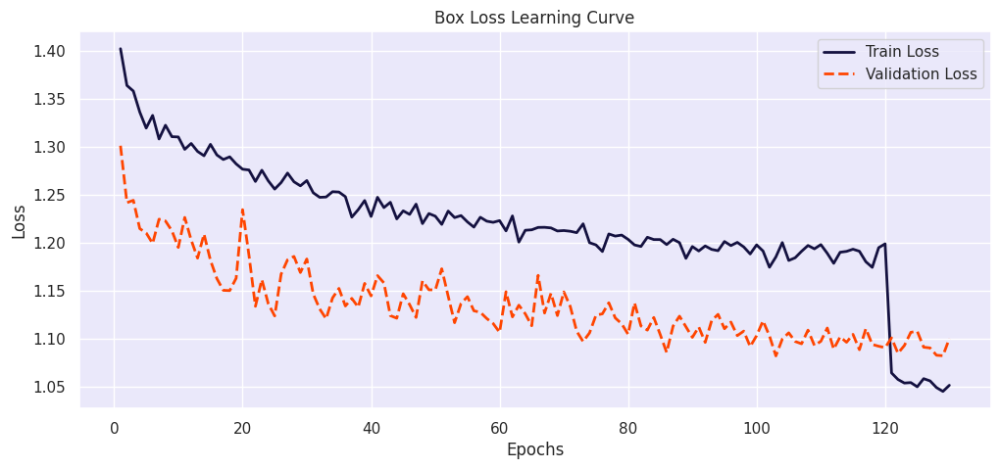

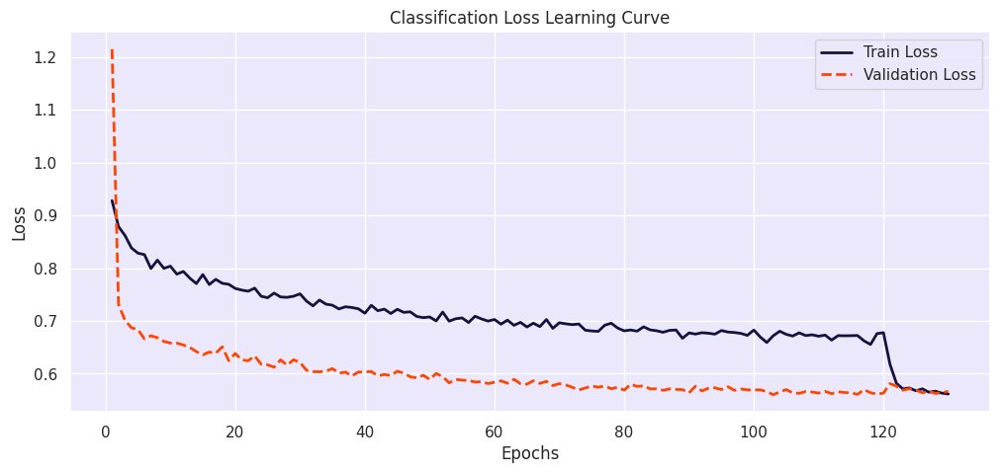

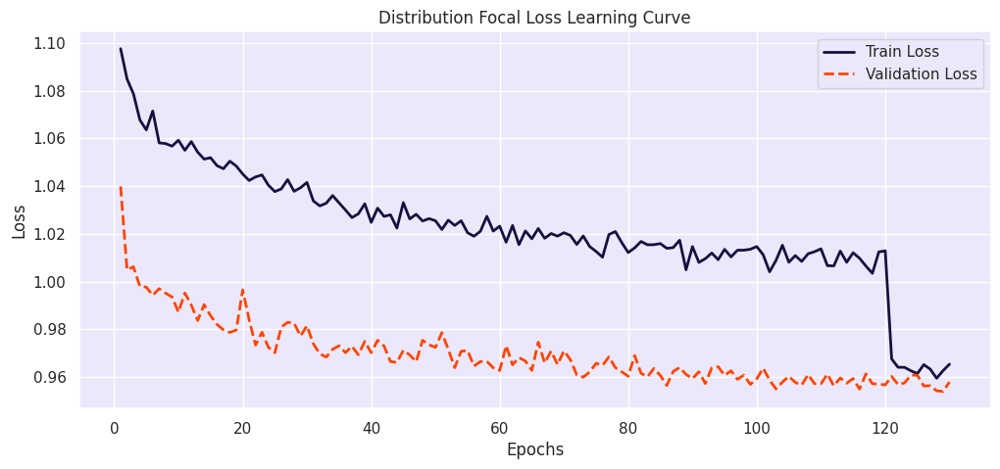

In [24]:
# Create the full file path for 'results.csv' using the directory path and file name
results_csv_path = os.path.join(post_train_path, 'results.csv')

# Load the CSV file from the constructed path into a pandas DataFrame
df = pd.read_csv(results_csv_path)

# Remove any leading whitespace from the column names
df.columns = df.columns.str.strip()

# Plot the learning curves for each loss
plot_learning_curve(df, 'train/box_loss', 'val/box_loss', 'Box Loss Learning Curve')
plot_learning_curve(df, 'train/cls_loss', 'val/cls_loss', 'Classification Loss Learning Curve')
plot_learning_curve(df, 'train/dfl_loss', 'val/dfl_loss', 'Distribution Focal Loss Learning Curve')

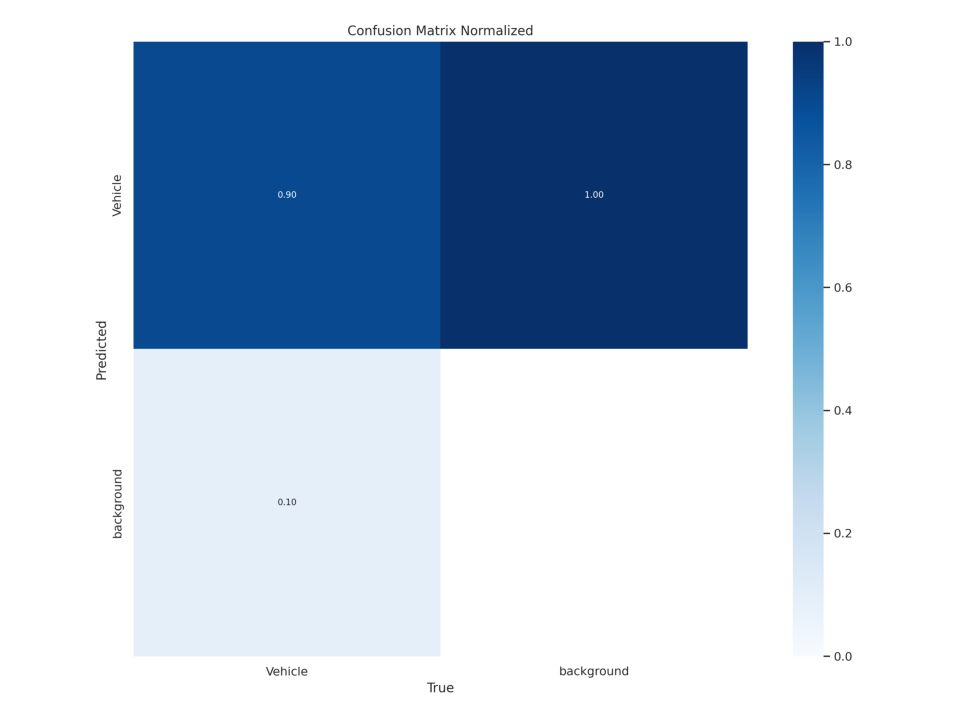

In [26]:
# Construct the path to the normalized confusion matrix image
confusion_matrix_path = os.path.join(post_train_path, 'confusion_matrix_normalized.png')

# Read the image using cv2
cm_img = cv2.imread(confusion_matrix_path)

# Convert the image from BGR to RGB color space for accurate color representation with matplotlib
cm_img = cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB)

# Display the image
plt.figure(figsize=(10, 10), dpi=120)
plt.imshow(cm_img)
plt.axis('off')
plt.show()

In [31]:
# Construct the path to the best model weights file using os.path.join
best_model_path = os.path.join(post_train_path, 'weights/best.pt')

# Load the best model weights into the YOLO model
best_model = YOLO(best_model_path)

# Validate the best model using the validation set with default parameters
metrics = best_model.val(split='val')

Ultralytics 8.3.122 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 1.7±1.2 ms, read: 29.6±11.5 MB/s, size: 54.7 KB)


val: Scanning /content/gdrive/.shortcut-targets-by-id/1yNzPyIi-U5t-p1n3phwuaNsjQjI4ruA2/Vehicle_Detection_Image_Dataset/valid/labels.cache... 295 images, 0 backgrounds, 0 corrupt: 100%|██████████| 295/295 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:16<00:00,  1.15it/s]


                   all        295       4358      0.861      0.847      0.923      0.646
Speed: 3.7ms preprocess, 5.5ms inference, 0.0ms loss, 6.3ms postprocess per image
Results saved to runs/detect/val6


In [32]:
# Convert the dictionary to a pandas DataFrame and use the keys as the index
metrics_df = pd.DataFrame.from_dict(metrics.results_dict, orient='index', columns=['Metric Value'])

# Display the DataFrame
metrics_df.round(3)

,Metric Value
metrics/precision(B),0.861
metrics/recall(B),0.847
metrics/mAP50(B),0.923
metrics/mAP50-95(B),0.646
fitness,0.674



image 1/1 /content/gdrive/MyDrive/Vehicle_Detection_Image_Dataset/Vehicle_Detection_dataset_augmented/valid/images/1_mp4-3_jpg.rf.2938561db379cee61a0a06d1cbef53fb.jpg: 640x640 7 Vehicles, 8.4ms
Speed: 2.1ms preprocess, 8.4ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/gdrive/MyDrive/Vehicle_Detection_Image_Dataset/Vehicle_Detection_dataset_augmented/valid/images/12_mp4-23_jpg.rf.d2a311df2f03c3cecf3ba66942c21a25.jpg: 640x640 4 Vehicles, 7.4ms
Speed: 1.8ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/gdrive/MyDrive/Vehicle_Detection_Image_Dataset/Vehicle_Detection_dataset_augmented/valid/images/test_mp4-13_jpg.rf.b5620e78617df25e8e6b282bee9408be.jpg: 640x640 16 Vehicles, 23.1ms
Speed: 4.6ms preprocess, 23.1ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/gdrive/MyDrive/Vehicle_Detection_Image_Dataset/Vehicle_Detection_dataset_augmented/valid/images/6_

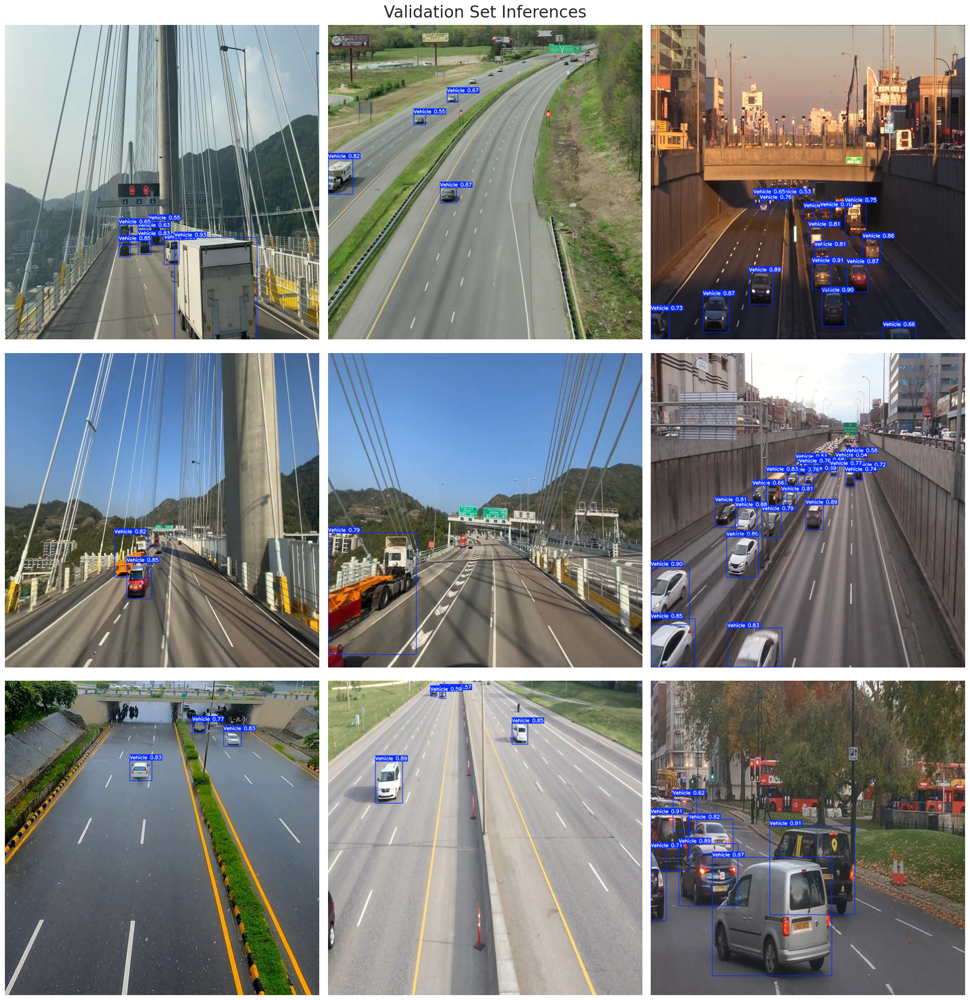

In [29]:
# Define the path to the validation images
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# List all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Select 9 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 9)]

# Initialize the subplot
fig, axes = plt.subplots(3, 3, figsize=(20, 21))
fig.suptitle('Validation Set Inferences', fontsize=24)

# Perform inference on each selected image and display it
for i, ax in enumerate(axes.flatten()):
    image_path = os.path.join(valid_images_path, selected_images[i])
    results = best_model.predict(source=image_path, imgsz=640, conf=0.5)
    annotated_image = results[0].plot(line_width=1)
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')

plt.tight_layout()
plt.show()


image 1/1 /content/gdrive/MyDrive/Vehicle_Detection_Image_Dataset/sample_image.jpg: 384x640 7 Vehicles, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


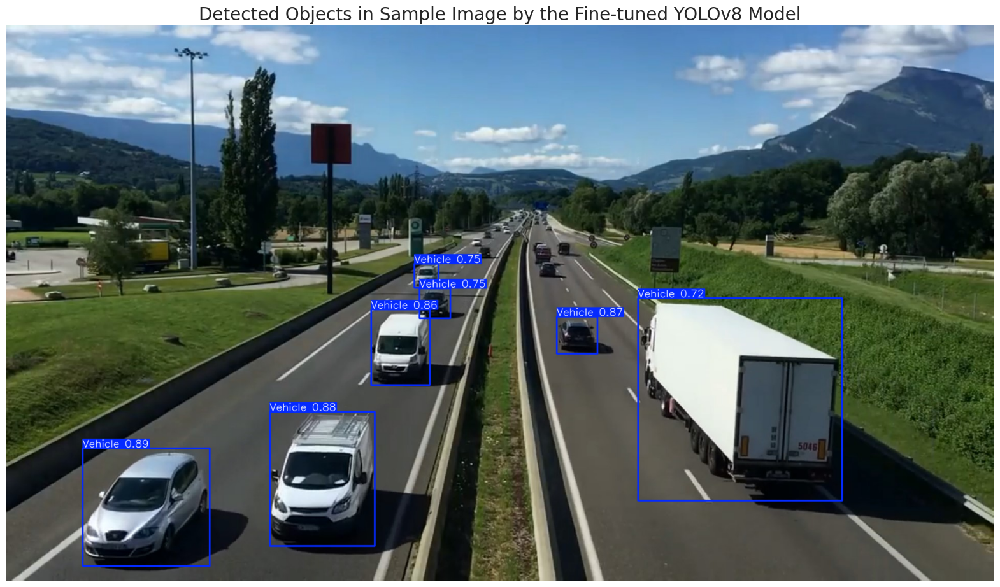

In [30]:
# Path to the image file
sample_image_path = '/content/gdrive/MyDrive/Vehicle_Detection_Image_Dataset/sample_image.jpg'

# Perform inference on the provided image using best model
results = best_model.predict(source=sample_image_path, imgsz=640, conf=0.7)

# Annotate and convert image to numpy array
sample_image = results[0].plot(line_width=2)

# Convert the color of the image from BGR to RGB for correct color representation in matplotlib
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

# Display annotated image
plt.figure(figsize=(20,15))
plt.imshow(sample_image)
plt.title('Detected Objects in Sample Image by the Fine-tuned YOLOv8 Model', fontsize=20)
plt.axis('off')
plt.show()

In [ ]:
import shutil

In [ ]:
# Define the path to the sample video in the dataset
dataset_video_path = '/content/gdrive/MyDrive/Vehicle_Detection_Image_Dataset/sample_video.mp4'

# Define the destination path in the working directory
video_path = '/content/gdrive/MyDrive/Vehicle_Detection_Image_Dataset/runs/detect/train/sample_video.mp4'

# Copy the video file from its original location in the dataset to the current working directory in Kaggle for further processing
shutil.copyfile(dataset_video_path, video_path)

# Initiate vehicle detection on the sample video using the best performing model and save the output
best_model.predict(source=video_path, save=True)

In [ ]:
import locale
import os

# Set locale to UTF-8
os.environ["LC_ALL"] = "C.UTF-8"
os.environ["LANG"] = "C.UTF-8"
locale.setlocale(locale.LC_ALL, "C.UTF-8")

# Verify the change
print(f"New locale: {locale.getpreferredencoding()}")


In [ ]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [ ]:
!apt-get update
!apt-get install -y ffmpeg

!ffmpeg -y -loglevel panic -i "/content/gdrive/MyDrive/Vehicle_Detection_Image_Dataset/runs/detect/predict/sample_video.avi" processed_sample_video.mp4


In [ ]:
Video("processed_sample_video.mp4", embed=True, width=960)

In [ ]:
# Define the threshold for considering traffic as heavy
heavy_traffic_threshold = 4

# Define the vertices for the quadrilaterals
vertices1 = np.array([(465, 350), (609, 350), (510, 630), (2, 630)], dtype=np.int32)
vertices2 = np.array([(678, 350), (815, 350), (1203, 630), (743, 630)], dtype=np.int32)

# Define the vertical range for the slice and lane threshold
x1, x2 = 325, 635
lane_threshold = 609

# Define the positions for the text annotations on the image
text_position_left_lane = (10, 50)
text_position_right_lane = (820, 50)
intensity_position_left_lane = (10, 100)
intensity_position_right_lane = (820, 100)

# Define font, scale, and colors for the annotations
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
font_color = (255, 255, 255)    # White color for text
background_color = (0, 0, 255)  # Red background for text

# Open the video
cap = cv2.VideoCapture('sample_video.mp4')

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('traffic_density_analysis.avi', fourcc, 20.0, (int(cap.get(3)), int(cap.get(4))))

# Read until video is completed
while cap.isOpened():
    # Capture frame-by-frame
    ret, frame = cap.read()
    if ret:
        # Create a copy of the original frame to modify
        detection_frame = frame.copy()

        # Black out the regions outside the specified vertical range
        detection_frame[:x1, :] = 0  # Black out from top to x1
        detection_frame[x2:, :] = 0  # Black out from x2 to the bottom of the frame

        # Perform inference on the modified frame
        results = best_model.predict(detection_frame, imgsz=640, conf=0.4)
        processed_frame = results[0].plot(line_width=1)

        # Restore the original top and bottom parts of the frame
        processed_frame[:x1, :] = frame[:x1, :].copy()
        processed_frame[x2:, :] = frame[x2:, :].copy()

        # Draw the quadrilaterals on the processed frame
        cv2.polylines(processed_frame, [vertices1], isClosed=True, color=(0, 255, 0), thickness=2)
        cv2.polylines(processed_frame, [vertices2], isClosed=True, color=(255, 0, 0), thickness=2)

        # Retrieve the bounding boxes from the results
        bounding_boxes = results[0].boxes

        # Initialize counters for vehicles in each lane
        vehicles_in_left_lane = 0
        vehicles_in_right_lane = 0
        # Loop through each bounding box to count vehicles in each lane
        for box in bounding_boxes.xyxy:
            # Check if the vehicle is in the left lane based on the x-coordinate of the bounding box
            if box[0] < lane_threshold:
                vehicles_in_left_lane += 1
            else:
                vehicles_in_right_lane += 1

        # Determine the traffic intensity for the left lane
        traffic_intensity_left = "Heavy" if vehicles_in_left_lane > heavy_traffic_threshold else "Smooth"
        # Determine the traffic intensity for the right lane
        traffic_intensity_right = "Heavy" if vehicles_in_right_lane > heavy_traffic_threshold else "Smooth"
        # Add a background rectangle for the left lane vehicle count
        cv2.rectangle(processed_frame, (text_position_left_lane[0]-10, text_position_left_lane[1] - 25),
                      (text_position_left_lane[0] + 460, text_position_left_lane[1] + 10), background_color, -1)

        # Add the vehicle count text on top of the rectangle for the left lane
        cv2.putText(processed_frame, f'Vehicles in Left Lane: {vehicles_in_left_lane}', text_position_left_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # Add a background rectangle for the left lane traffic intensity
        cv2.rectangle(processed_frame, (intensity_position_left_lane[0]-10, intensity_position_left_lane[1] - 25),
                      (intensity_position_left_lane[0] + 460, intensity_position_left_lane[1] + 10), background_color, -1)

        # Add the traffic intensity text on top of the rectangle for the left lane
        cv2.putText(processed_frame, f'Traffic Intensity: {traffic_intensity_left}', intensity_position_left_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # Add a background rectangle for the right lane vehicle count
        cv2.rectangle(processed_frame, (text_position_right_lane[0]-10, text_position_right_lane[1] - 25),
                      (text_position_right_lane[0] + 460, text_position_right_lane[1] + 10), background_color, -1)

        # Add the vehicle count text on top of the rectangle for the right lane
        cv2.putText(processed_frame, f'Vehicles in Right Lane: {vehicles_in_right_lane}', text_position_right_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # Add a background rectangle for the right lane traffic intensity
        cv2.rectangle(processed_frame, (intensity_position_right_lane[0]-10, intensity_position_right_lane[1] - 25),
                      (intensity_position_right_lane[0] + 460, intensity_position_right_lane[1] + 10), background_color, -1)
        # Add the traffic intensity text on top of the rectangle for the right lane
        cv2.putText(processed_frame, f'Traffic Intensity: {traffic_intensity_right}', intensity_position_right_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # Write the processed frame to the output video
        out.write(processed_frame)

        # Uncomment the following 3 lines if running this code on a local machine to view the real-time processing results
        # cv2.imshow('Real-time Analysis', processed_frame)
        # if cv2.waitKey(1) & 0xFF == ord('q'):  # Press Q on keyboard to exit the loop
        #     break
    else:
        break

# Release the video capture and video write objects
cap.release()
out.release()

# Close all the frames
# cv2.destroyAllWindows()

In [ ]:
# Convert the .avi video generated by our traffic density estimation app to .mp4 format for compatibility with notebook display
!ffmpeg -y -loglevel panic -i /content/gdrive/MyDrive/Vehicle_Detection_Image_Dataset/traffic_density_analysis.avi traffic_density_analysis.mp4


Video("traffic_density_analysis.mp4", embed=True, width=960)

In [ ]:
best_model.export(format='onnx')